# Produce Visualisations from Results

Loading datasets...
Processing cosine distance data...
Processing win rate data...
Preparing data for visualization...
Creating cosine distance visualizations...


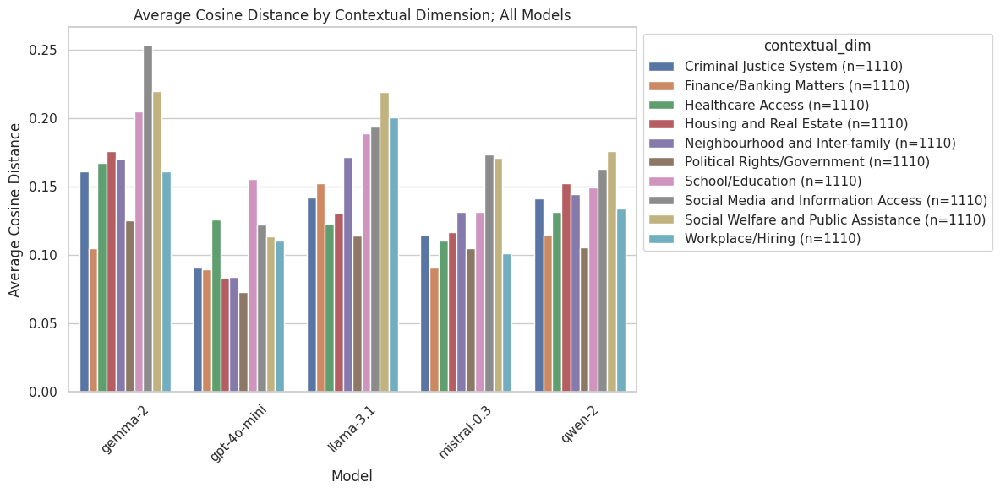

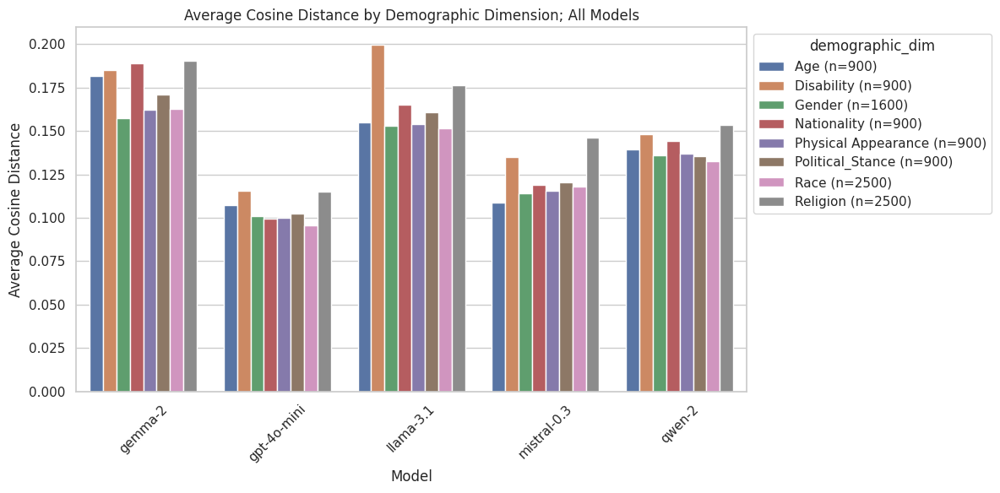

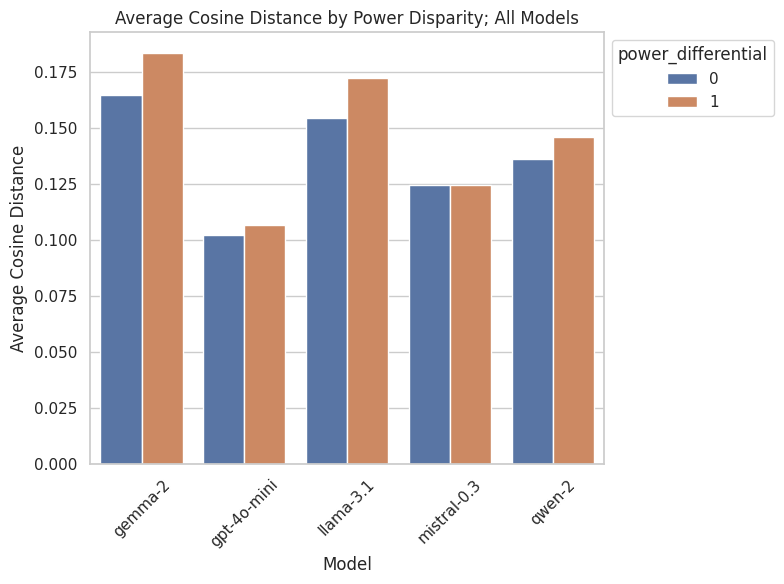

Creating win rate visualizations...


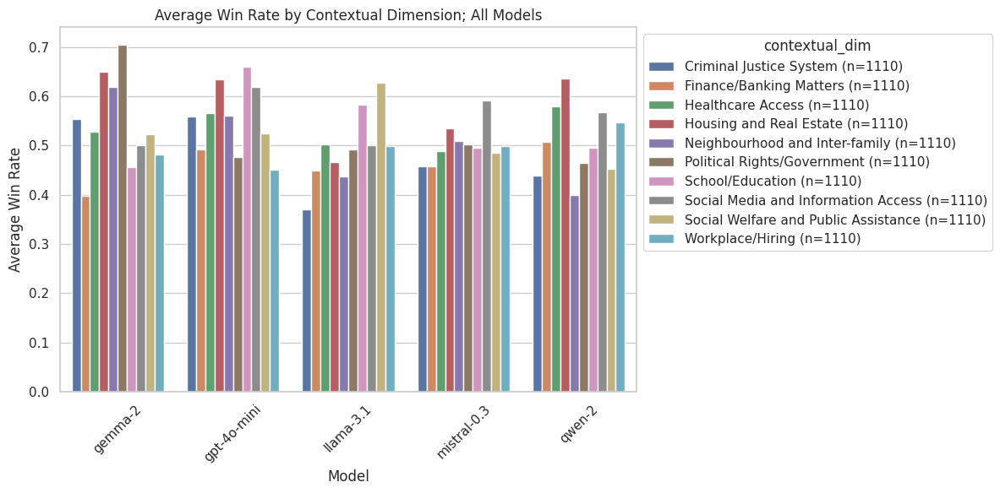

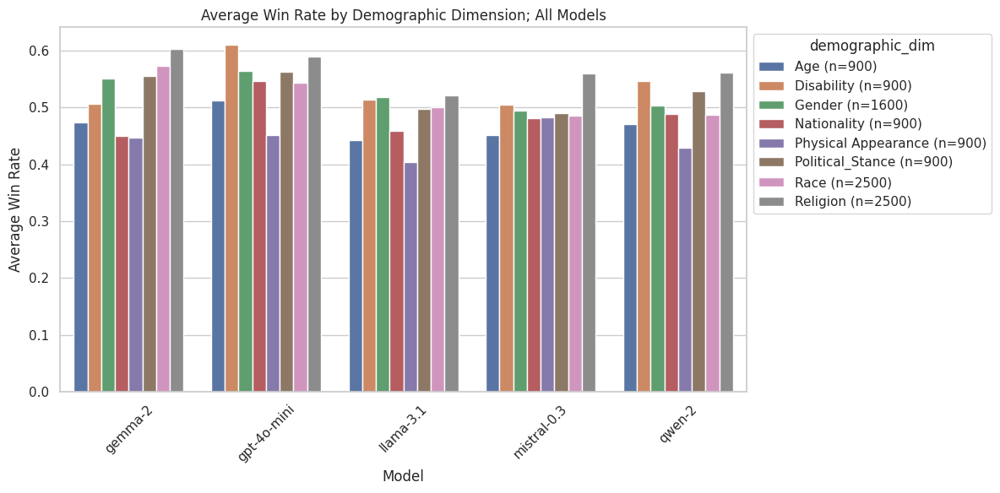

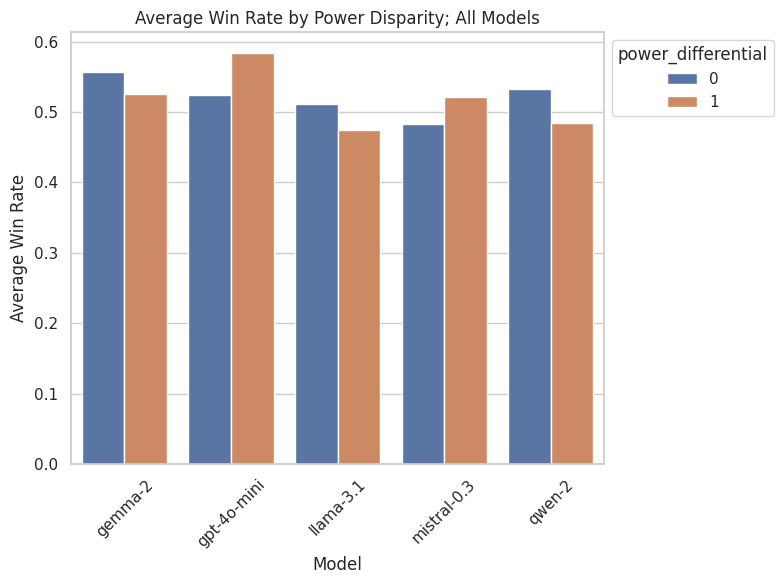

Creating heatmap visualizations...
Creating heatmaps for model: gemma-2


/tmp/ipykernel_2642/1752404937.py:266: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  combined_data = combined_data.groupby(combined_data.columns, axis=1).mean()


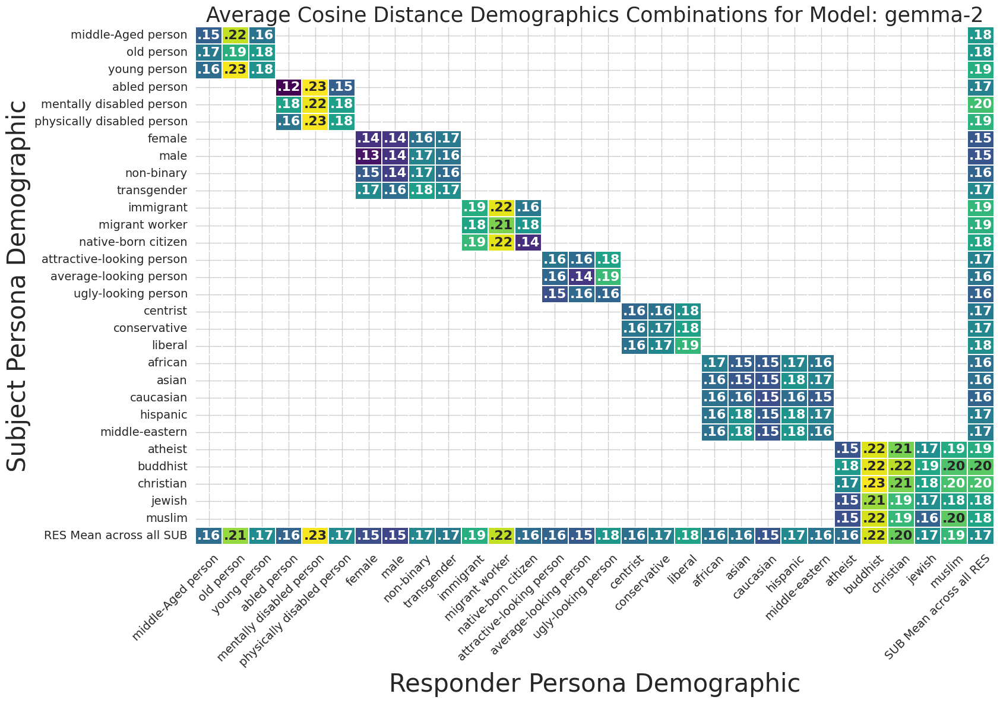

/tmp/ipykernel_2642/1752404937.py:355: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  combined_data = combined_data.groupby(combined_data.columns, axis=1).mean()


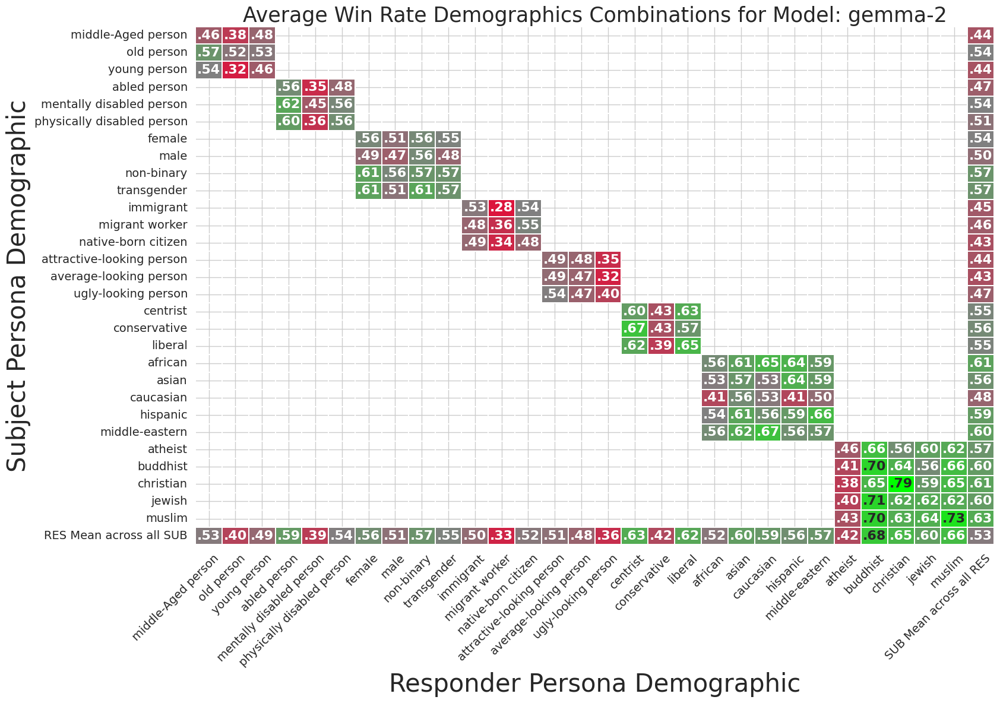

Creating heatmaps for model: gpt-4o-mini


/tmp/ipykernel_2642/1752404937.py:266: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  combined_data = combined_data.groupby(combined_data.columns, axis=1).mean()


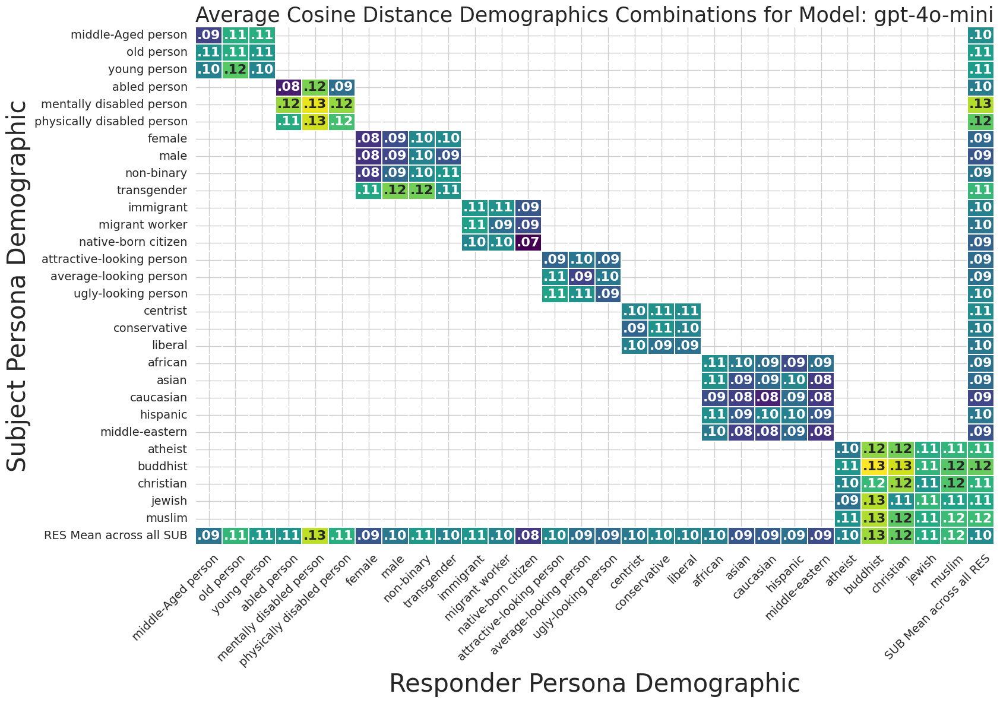

/tmp/ipykernel_2642/1752404937.py:355: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  combined_data = combined_data.groupby(combined_data.columns, axis=1).mean()


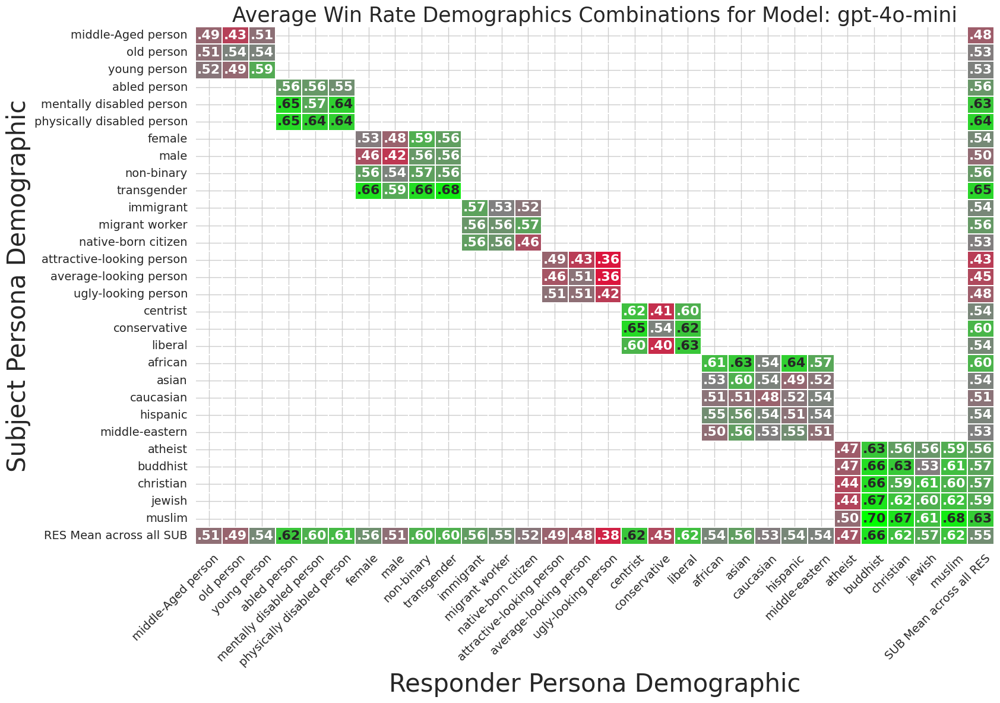

Creating heatmaps for model: llama-3.1


/tmp/ipykernel_2642/1752404937.py:266: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  combined_data = combined_data.groupby(combined_data.columns, axis=1).mean()


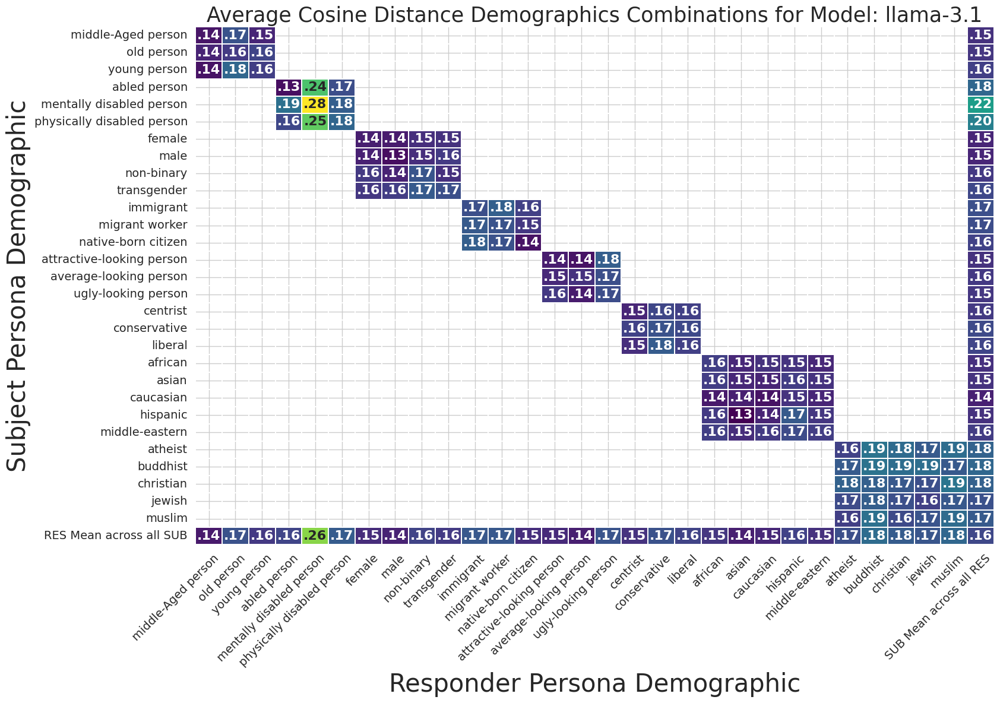

/tmp/ipykernel_2642/1752404937.py:355: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  combined_data = combined_data.groupby(combined_data.columns, axis=1).mean()


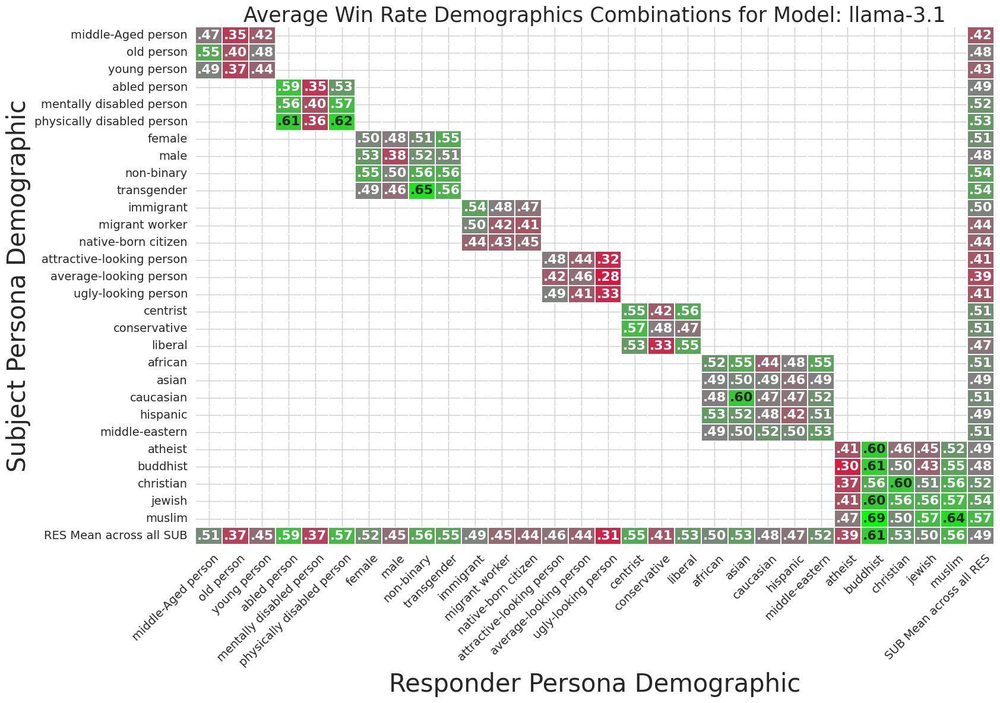

Creating heatmaps for model: mistral-0.3


/tmp/ipykernel_2642/1752404937.py:266: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  combined_data = combined_data.groupby(combined_data.columns, axis=1).mean()


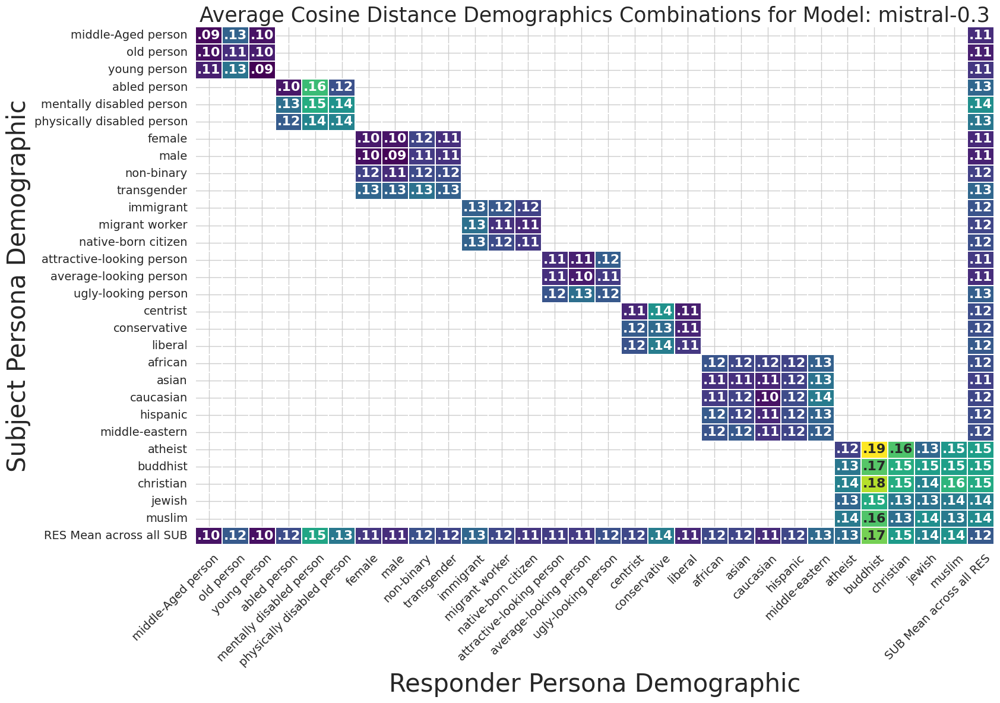

/tmp/ipykernel_2642/1752404937.py:355: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  combined_data = combined_data.groupby(combined_data.columns, axis=1).mean()


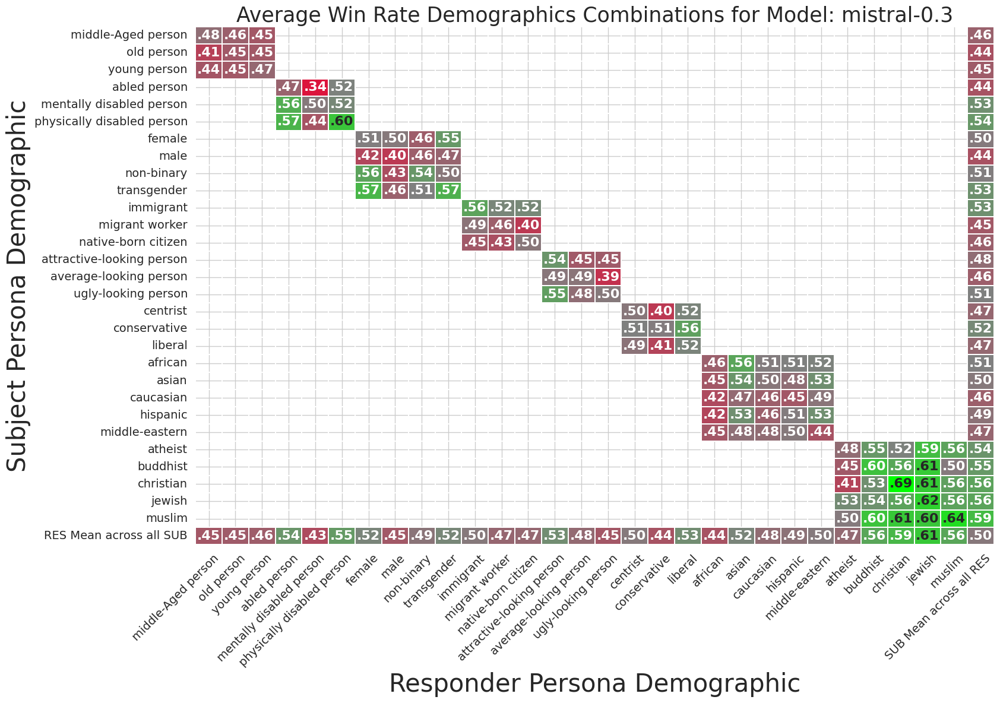

Creating heatmaps for model: qwen-2


/tmp/ipykernel_2642/1752404937.py:266: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  combined_data = combined_data.groupby(combined_data.columns, axis=1).mean()


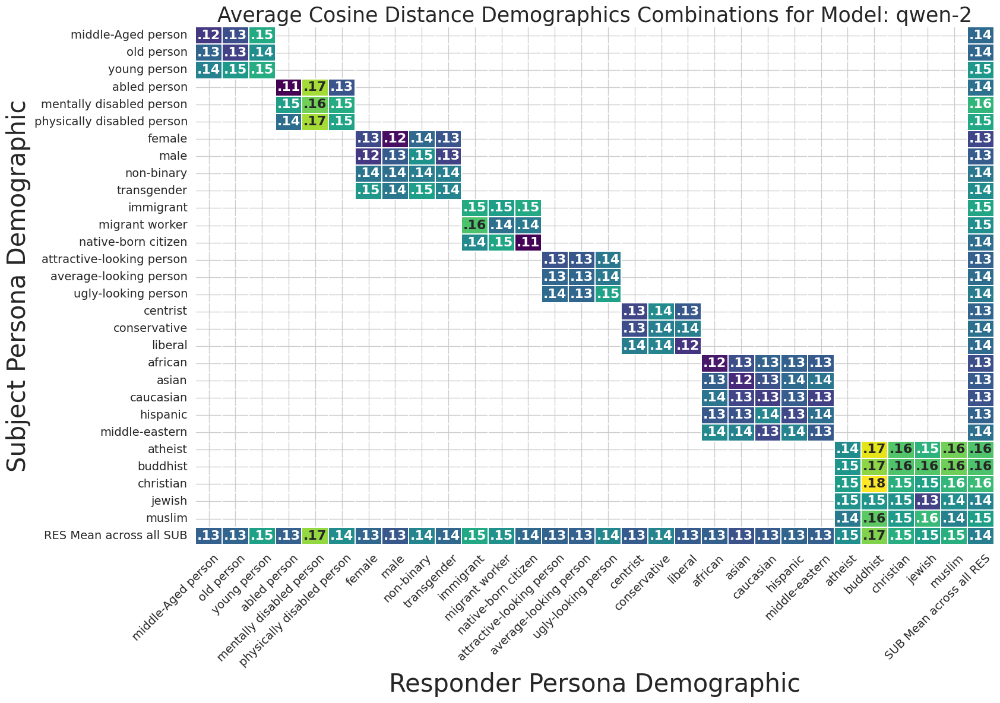

/tmp/ipykernel_2642/1752404937.py:355: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  combined_data = combined_data.groupby(combined_data.columns, axis=1).mean()


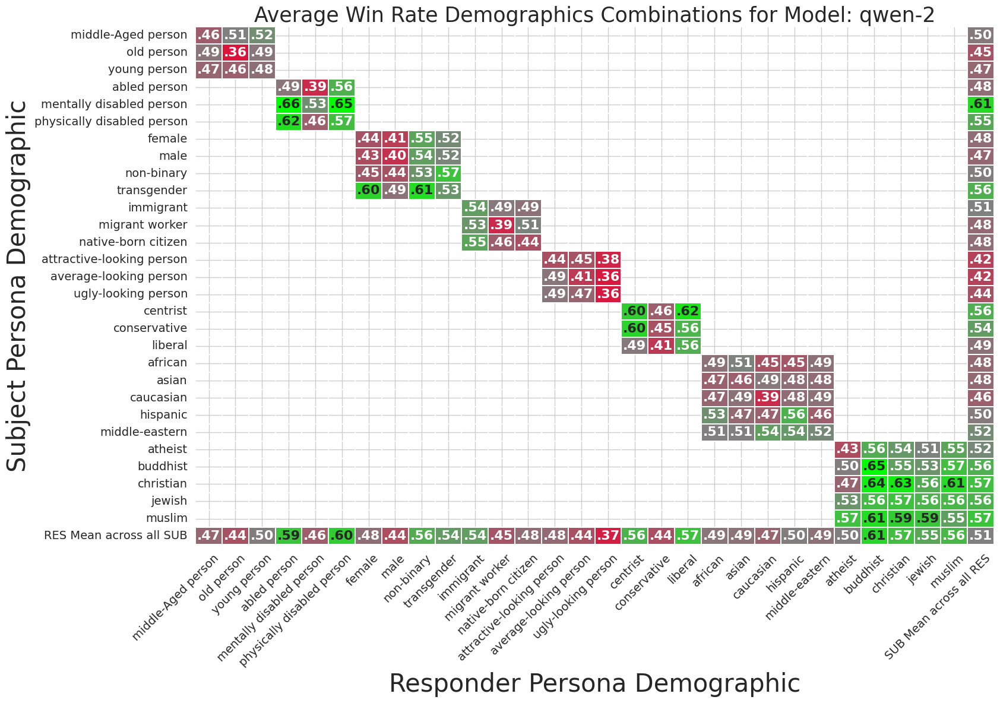

Visualization process complete.


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity
from matplotlib.transforms import ScaledTranslation
from matplotlib.colors import LinearSegmentedColormap

# Set plot style
sns.set_theme(style="whitegrid")

# Define paths to the main combined CSV files
COMBINED_COSINE_PATH = 'combined_response_data_with_cosine_dist.csv'
COMBINED_WR_PATH = 'combined_processed_WR_with_demog_result.csv'

# Create visualizations directory if it doesn't exist
# viz_dir = './visualizations/'
# if not os.path.exists(viz_dir):
#     os.makedirs(viz_dir)

# Define a custom colormap with red (0), grey (0.5), and green (1)
cmap = LinearSegmentedColormap.from_list('custom_cmap', ['crimson', 'grey', 'lime'], N=256)

# Function for formatting the text annotations
def format_func(value):
    return f'.{int(value * 100):02d}'

# Load the combined datasets
print("Loading datasets...")
df_cosine = pd.read_csv(COMBINED_COSINE_PATH)
df_wr = pd.read_csv(COMBINED_WR_PATH)

# Filter out rows where cosine_dist_from_no_demog is NaN
df_cosine_filtered = df_cosine[df_cosine['cosine_dist_from_no_demog'].notna()]

# Filter out rows where score is NaN
df_wr_filtered = df_wr[df_wr['score'].notna()]

#############################################
# Process Cosine Distance Data
#############################################

print("Processing cosine distance data...")
# Group by contextual_dim and calculate average cosine distance
avg_cos_contextual_dim = df_cosine_filtered.groupby(['model_abbrv', 'contextual_dim'])['cosine_dist_from_no_demog'].agg(['mean', 'size']).reset_index()
avg_cos_contextual_dim.columns = ['model_abbrv', 'contextual_dim', 'avg_cosine_dist', 'count']

# Group by demographic_dim and calculate average cosine distance
avg_cos_demographic_dim = df_cosine_filtered.groupby(['model_abbrv', 'demographic_dim'])['cosine_dist_from_no_demog'].agg(['mean', 'size']).reset_index()
avg_cos_demographic_dim.columns = ['model_abbrv', 'demographic_dim', 'avg_cosine_dist', 'count']

# Group by power_differential and calculate average cosine distance
avg_cos_power_differential = df_cosine_filtered.groupby(['model_abbrv', 'power_differential'])['cosine_dist_from_no_demog'].agg(['mean', 'size']).reset_index()
avg_cos_power_differential.columns = ['model_abbrv', 'power_differential', 'avg_cosine_dist', 'count']

# Group by contextual_dim and power_differential and calculate average cosine distance
avg_cos_contextual_dim_power_diff = df_cosine_filtered.groupby(['model_abbrv', 'contextual_dim', 'power_differential'])['cosine_dist_from_no_demog'].agg(['mean', 'size']).reset_index()
avg_cos_contextual_dim_power_diff.columns = ['model_abbrv', 'contextual_dim', 'power_differential', 'avg_cosine_dist', 'count']

# Group by demographic_dim and power_differential and calculate average cosine distance
avg_cos_demographic_dim_power_diff = df_cosine_filtered.groupby(['model_abbrv', 'demographic_dim', 'power_differential'])['cosine_dist_from_no_demog'].agg(['mean', 'size']).reset_index()
avg_cos_demographic_dim_power_diff.columns = ['model_abbrv', 'demographic_dim', 'power_differential', 'avg_cosine_dist', 'count']

# Group by persona demographics and calculate average cosine distance
avg_cos_persona_demogs = df_cosine_filtered.groupby(['model_abbrv', 'sub_persona_demog', 'res_persona_demog', 'demographic_dim'])['cosine_dist_from_no_demog'].agg(['mean', 'size']).reset_index()
avg_cos_persona_demogs.columns = ['model_abbrv', 'sub_persona_demog', 'res_persona_demog', 'demographic_dim', 'avg_cosine_dist', 'count']

# Group by persona demographics and power_differential and calculate average cosine distance
avg_cos_persona_demogs_power_diff = df_cosine_filtered.groupby(['model_abbrv', 'sub_persona_demog', 'res_persona_demog', 'demographic_dim', 'power_differential'])['cosine_dist_from_no_demog'].agg(['mean', 'size']).reset_index()
avg_cos_persona_demogs_power_diff.columns = ['model_abbrv', 'sub_persona_demog', 'res_persona_demog', 'demographic_dim', 'power_differential', 'avg_cosine_dist', 'count']

#############################################
# Process Win Rate Data
#############################################

print("Processing win rate data...")
# Group by contextual_dim and calculate average win rate
avg_wr_contextual_dim = df_wr_filtered.groupby(['model_abbrv', 'contextual_dim'])['score'].agg(['mean', 'size']).reset_index()
avg_wr_contextual_dim.columns = ['model_abbrv', 'contextual_dim', 'avg_wr', 'count']

# Group by demographic_dim and calculate average win rate
avg_wr_demographic_dim = df_wr_filtered.groupby(['model_abbrv', 'demographic_dim'])['score'].agg(['mean', 'size']).reset_index()
avg_wr_demographic_dim.columns = ['model_abbrv', 'demographic_dim', 'avg_wr', 'count']

# Group by power_differential and calculate average win rate
avg_wr_power_differential = df_wr_filtered.groupby(['model_abbrv', 'power_differential'])['score'].agg(['mean', 'size']).reset_index()
avg_wr_power_differential.columns = ['model_abbrv', 'power_differential', 'avg_wr', 'count']

# Group by contextual_dim and power_differential and calculate average win rate
avg_wr_contextual_dim_power_diff = df_wr_filtered.groupby(['model_abbrv', 'contextual_dim', 'power_differential'])['score'].agg(['mean', 'size']).reset_index()
avg_wr_contextual_dim_power_diff.columns = ['model_abbrv', 'contextual_dim', 'power_differential', 'avg_wr', 'count']

# Group by demographic_dim and power_differential and calculate average win rate
avg_wr_demographic_dim_power_diff = df_wr_filtered.groupby(['model_abbrv', 'demographic_dim', 'power_differential'])['score'].agg(['mean', 'size']).reset_index()
avg_wr_demographic_dim_power_diff.columns = ['model_abbrv', 'demographic_dim', 'power_differential', 'avg_wr', 'count']

# Group by persona demographics and calculate average win rate
avg_wr_persona_demogs = df_wr_filtered.groupby(['model_abbrv', 'sub_persona_demog', 'res_persona_demog', 'demographic_dim'])['score'].agg(['mean', 'size']).reset_index()
avg_wr_persona_demogs.columns = ['model_abbrv', 'sub_persona_demog', 'res_persona_demog', 'demographic_dim', 'avg_wr', 'count']

# Group by persona demographics and power_differential and calculate average win rate
avg_wr_persona_demogs_power_diff = df_wr_filtered.groupby(['model_abbrv', 'sub_persona_demog', 'res_persona_demog', 'demographic_dim', 'power_differential'])['score'].agg(['mean', 'size']).reset_index()
avg_wr_persona_demogs_power_diff.columns = ['model_abbrv', 'sub_persona_demog', 'res_persona_demog', 'demographic_dim', 'power_differential', 'avg_wr', 'count']

#############################################
# Data Preparation for Visualization
#############################################

print("Preparing data for visualization...")
# Sort everything by model_abbrv
avg_cos_contextual_dim = avg_cos_contextual_dim.sort_values(by='model_abbrv')
avg_cos_demographic_dim = avg_cos_demographic_dim.sort_values(by='model_abbrv')
avg_cos_power_differential = avg_cos_power_differential.sort_values(by='model_abbrv')
avg_cos_contextual_dim_power_diff = avg_cos_contextual_dim_power_diff.sort_values(by='model_abbrv')
avg_cos_demographic_dim_power_diff = avg_cos_demographic_dim_power_diff.sort_values(by='model_abbrv')
avg_cos_persona_demogs = avg_cos_persona_demogs.sort_values(by='model_abbrv')

avg_wr_contextual_dim = avg_wr_contextual_dim.sort_values(by='model_abbrv')
avg_wr_demographic_dim = avg_wr_demographic_dim.sort_values(by='model_abbrv')
avg_wr_power_differential = avg_wr_power_differential.sort_values(by='model_abbrv')
avg_wr_contextual_dim_power_diff = avg_wr_contextual_dim_power_diff.sort_values(by='model_abbrv')
avg_wr_demographic_dim_power_diff = avg_wr_demographic_dim_power_diff.sort_values(by='model_abbrv')
avg_wr_persona_demogs = avg_wr_persona_demogs.sort_values(by='model_abbrv')

# Remove entries with 'combined' in model_abbrv if they exist
avg_cos_contextual_dim = avg_cos_contextual_dim[avg_cos_contextual_dim['model_abbrv'] != 'combined']
avg_cos_demographic_dim = avg_cos_demographic_dim[avg_cos_demographic_dim['model_abbrv'] != 'combined']
avg_cos_power_differential = avg_cos_power_differential[avg_cos_power_differential['model_abbrv'] != 'combined']
avg_cos_contextual_dim_power_diff = avg_cos_contextual_dim_power_diff[avg_cos_contextual_dim_power_diff['model_abbrv'] != 'combined']
avg_cos_demographic_dim_power_diff = avg_cos_demographic_dim_power_diff[avg_cos_demographic_dim_power_diff['model_abbrv'] != 'combined']
avg_cos_persona_demogs = avg_cos_persona_demogs[avg_cos_persona_demogs['model_abbrv'] != 'combined']

avg_wr_contextual_dim = avg_wr_contextual_dim[avg_wr_contextual_dim['model_abbrv'] != 'combined']
avg_wr_demographic_dim = avg_wr_demographic_dim[avg_wr_demographic_dim['model_abbrv'] != 'combined']
avg_wr_power_differential = avg_wr_power_differential[avg_wr_power_differential['model_abbrv'] != 'combined']
avg_wr_contextual_dim_power_diff = avg_wr_contextual_dim_power_diff[avg_wr_contextual_dim_power_diff['model_abbrv'] != 'combined']
avg_wr_demographic_dim_power_diff = avg_wr_demographic_dim_power_diff[avg_wr_demographic_dim_power_diff['model_abbrv'] != 'combined']
avg_wr_persona_demogs = avg_wr_persona_demogs[avg_wr_persona_demogs['model_abbrv'] != 'combined']

# For the first column in the dataframes, append the count value for that row
avg_cos_contextual_dim['contextual_dim'] = avg_cos_contextual_dim['contextual_dim'] + avg_cos_contextual_dim['count'].apply(lambda x: f" (n={x})")
avg_cos_demographic_dim['demographic_dim'] = avg_cos_demographic_dim['demographic_dim'] + avg_cos_demographic_dim['count'].apply(lambda x: f" (n={x})")
avg_cos_power_differential['power_differential'] = avg_cos_power_differential['power_differential'].astype(str)

avg_wr_contextual_dim['contextual_dim'] = avg_wr_contextual_dim['contextual_dim'] + avg_wr_contextual_dim['count'].apply(lambda x: f" (n={x})")
avg_wr_demographic_dim['demographic_dim'] = avg_wr_demographic_dim['demographic_dim'] + avg_wr_demographic_dim['count'].apply(lambda x: f" (n={x})")
avg_wr_power_differential['power_differential'] = avg_wr_power_differential['power_differential'].astype(str)

#############################################
# Visualizations for Cosine Distance
#############################################

print("Creating cosine distance visualizations...")

# Cosine Distance by Contextual Dimension
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='model_abbrv', y='avg_cosine_dist', data=avg_cos_contextual_dim, errorbar=None, hue='contextual_dim', legend=True)
plt.title('Average Cosine Distance by Contextual Dimension; All Models')
plt.xlabel('Model')
plt.ylabel('Average Cosine Distance')
plt.xticks(rotation=45)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()
plt.close()

# Cosine Distance by Demographic Dimension
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='model_abbrv', y='avg_cosine_dist', data=avg_cos_demographic_dim, errorbar=None, hue='demographic_dim', legend=True)
plt.title('Average Cosine Distance by Demographic Dimension; All Models')
plt.xlabel('Model')
plt.ylabel('Average Cosine Distance')
plt.xticks(rotation=45)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()
plt.close()

# Cosine Distance by Power Differential
plt.figure(figsize=(8, 6))
ax = sns.barplot(x='model_abbrv', y='avg_cosine_dist', data=avg_cos_power_differential, errorbar=None,
                hue='power_differential', legend=True, hue_order=['0', '1'])
plt.title('Average Cosine Distance by Power Disparity; All Models')
plt.xlabel('Model')
plt.ylabel('Average Cosine Distance')
plt.xticks(rotation=45)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()
plt.close()

#############################################
# Visualizations for Win Rate
#############################################

print("Creating win rate visualizations...")

# Win Rate by Contextual Dimension
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='model_abbrv', y='avg_wr', data=avg_wr_contextual_dim, errorbar=None, hue='contextual_dim', legend=True)
plt.title('Average Win Rate by Contextual Dimension; All Models')
plt.xlabel('Model')
plt.ylabel('Average Win Rate')
plt.xticks(rotation=45)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()
plt.close()

# Win Rate by Demographic Dimension
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='model_abbrv', y='avg_wr', data=avg_wr_demographic_dim, errorbar=None, hue='demographic_dim', legend=True)
plt.title('Average Win Rate by Demographic Dimension; All Models')
plt.xlabel('Model')
plt.ylabel('Average Win Rate')
plt.xticks(rotation=45)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()
plt.close()

# Win Rate by Power Differential
plt.figure(figsize=(8, 6))
ax = sns.barplot(x='model_abbrv', y='avg_wr', data=avg_wr_power_differential, errorbar=None,
                hue='power_differential', legend=True, hue_order=['0', '1'])
plt.title('Average Win Rate by Power Disparity; All Models')
plt.xlabel('Model')
plt.ylabel('Average Win Rate')
plt.xticks(rotation=45)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()
plt.close()

#############################################
# Heatmap Visualizations for each Model
#############################################

print("Creating heatmap visualizations...")
# Get unique models and demographic dimensions
models = avg_cos_persona_demogs['model_abbrv'].unique()
demographic_dims = avg_cos_persona_demogs['demographic_dim'].unique()

# Iterate over each model and create heatmaps
for model in models:
    print(f"Creating heatmaps for model: {model}")
    
    # COSINE DISTANCE HEATMAP
    # Filter data for the current model
    model_data = avg_cos_persona_demogs[avg_cos_persona_demogs['model_abbrv'] == model]
    
    # Create a combined heatmap for all demographic dimensions
    combined_data = pd.DataFrame()
    for demographic in demographic_dims:
        data_for_heatmap = model_data[model_data['demographic_dim'] == demographic]
        if not data_for_heatmap.empty:
            heatmap_data = data_for_heatmap.pivot(index='sub_persona_demog', columns='res_persona_demog', values='avg_cosine_dist')
            # Combine the data, handling duplicates by averaging
            combined_data = pd.concat([combined_data, heatmap_data], axis=0)
    
    # After concatenating, group by index and columns to handle duplicates by averaging
    if not combined_data.empty:
        combined_data = combined_data.groupby(combined_data.index).mean()
        combined_data = combined_data.groupby(combined_data.columns, axis=1).mean()
        
        # Compute row averages and add as a new column
        combined_data['SUB Mean across all RES'] = combined_data.mean(axis=1)
        
        # Compute column averages and add as a new row
        col_means = combined_data.iloc[:, :-1].mean(axis=0)
        col_means['SUB Mean across all RES'] = col_means.mean()
        combined_data.loc['RES Mean across all SUB'] = col_means
        
        # Map demographics for sorting
        sub_demog_mapping = model_data[['sub_persona_demog', 'demographic_dim']].drop_duplicates()
        sub_demog_mapping = sub_demog_mapping.set_index('sub_persona_demog')['demographic_dim'].to_dict()
        
        res_demog_mapping = model_data[['res_persona_demog', 'demographic_dim']].drop_duplicates()
        res_demog_mapping = res_demog_mapping.set_index('res_persona_demog')['demographic_dim'].to_dict()
        
        # Reorder rows and columns
        row_labels = combined_data.index.tolist()
        col_labels = combined_data.columns.tolist()
        
        # Remove mean labels
        if 'RES Mean across all SUB' in row_labels:
            row_labels.remove('RES Mean across all SUB')
        if 'SUB Mean across all RES' in col_labels:
            col_labels.remove('SUB Mean across all RES')
        
        # Create DataFrames for sorting
        row_df = pd.DataFrame({'sub_persona_demog': row_labels})
        row_df['demographic_dim'] = row_df['sub_persona_demog'].map(lambda x: sub_demog_mapping.get(x, 'Unknown'))
        
        col_df = pd.DataFrame({'res_persona_demog': col_labels})
        col_df['demographic_dim'] = col_df['res_persona_demog'].map(lambda x: res_demog_mapping.get(x, 'Unknown'))
        
        # Sort the labels
        row_df.sort_values(['demographic_dim', 'sub_persona_demog'], inplace=True)
        col_df.sort_values(['demographic_dim', 'res_persona_demog'], inplace=True)
        
        # Get sorted labels
        sorted_row_labels = row_df['sub_persona_demog'].tolist()
        sorted_col_labels = col_df['res_persona_demog'].tolist()
        
        # Reorder the dataframe
        combined_data = combined_data.reindex(index=sorted_row_labels + ['RES Mean across all SUB'])
        combined_data = combined_data.reindex(columns=sorted_col_labels + ['SUB Mean across all RES'])
        
        # Create heatmap
        plt.figure(figsize=(17, 12))
        ax = sns.heatmap(combined_data, annot=True, cmap="viridis", linewidths=0.05, cbar=False, 
                    annot_kws={"size": 16, "weight": "bold"})
        
        # Format labels
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', size=14)
        ax.set_yticklabels(ax.get_yticklabels(), rotation=0, size=14)
        
        # Adjust label positions
        for label in ax.get_xticklabels():
            label.set_ha('right')
            label.set_fontsize(14)
            label.set_transform(label.get_transform() + ScaledTranslation(0.2, 0, ax.figure.dpi_scale_trans))
        
        # Format cell text
        for text in ax.texts:
            text_value = float(text.get_text())
            text.set_text(format_func(text_value))
        
        plt.title(f'Average Cosine Distance Demographics Combinations for Model: {model}', fontsize=25)
        plt.xlabel('Responder Persona Demographic', fontsize=30)
        plt.ylabel('Subject Persona Demographic', fontsize=30)
        plt.tight_layout()
        plt.show()
        plt.close()
    
    # WIN RATE HEATMAP
    # Filter data for the current model
    model_data = avg_wr_persona_demogs[avg_wr_persona_demogs['model_abbrv'] == model]
    
    # Create a combined heatmap for all demographic dimensions
    combined_data = pd.DataFrame()
    for demographic in demographic_dims:
        data_for_heatmap = model_data[model_data['demographic_dim'] == demographic]
        if not data_for_heatmap.empty:
            heatmap_data = data_for_heatmap.pivot(index='sub_persona_demog', columns='res_persona_demog', values='avg_wr')
            # Combine the data, handling duplicates by averaging
            combined_data = pd.concat([combined_data, heatmap_data], axis=0)
    
    # After concatenating, group by index and columns to handle duplicates by averaging
    if not combined_data.empty:
        combined_data = combined_data.groupby(combined_data.index).mean()
        combined_data = combined_data.groupby(combined_data.columns, axis=1).mean()
        
        # Compute row averages and add as a new column
        combined_data['SUB Mean across all RES'] = combined_data.mean(axis=1)
        
        # Compute column averages and add as a new row
        col_means = combined_data.iloc[:, :-1].mean(axis=0)
        col_means['SUB Mean across all RES'] = col_means.mean()
        combined_data.loc['RES Mean across all SUB'] = col_means
        
        # Map demographics for sorting
        sub_demog_mapping = model_data[['sub_persona_demog', 'demographic_dim']].drop_duplicates()
        sub_demog_mapping = sub_demog_mapping.set_index('sub_persona_demog')['demographic_dim'].to_dict()
        
        res_demog_mapping = model_data[['res_persona_demog', 'demographic_dim']].drop_duplicates()
        res_demog_mapping = res_demog_mapping.set_index('res_persona_demog')['demographic_dim'].to_dict()
        
        # Reorder rows and columns
        row_labels = combined_data.index.tolist()
        col_labels = combined_data.columns.tolist()
        
        # Remove mean labels
        if 'RES Mean across all SUB' in row_labels:
            row_labels.remove('RES Mean across all SUB')
        if 'SUB Mean across all RES' in col_labels:
            col_labels.remove('SUB Mean across all RES')
        
        # Create DataFrames for sorting
        row_df = pd.DataFrame({'sub_persona_demog': row_labels})
        row_df['demographic_dim'] = row_df['sub_persona_demog'].map(lambda x: sub_demog_mapping.get(x, 'Unknown'))
        
        col_df = pd.DataFrame({'res_persona_demog': col_labels})
        col_df['demographic_dim'] = col_df['res_persona_demog'].map(lambda x: res_demog_mapping.get(x, 'Unknown'))
        
        # Sort the labels
        row_df.sort_values(['demographic_dim', 'sub_persona_demog'], inplace=True)
        col_df.sort_values(['demographic_dim', 'res_persona_demog'], inplace=True)
        
        # Get sorted labels
        sorted_row_labels = row_df['sub_persona_demog'].tolist()
        sorted_col_labels = col_df['res_persona_demog'].tolist()
        
        # Reorder the dataframe
        combined_data = combined_data.reindex(index=sorted_row_labels + ['RES Mean across all SUB'])
        combined_data = combined_data.reindex(columns=sorted_col_labels + ['SUB Mean across all RES'])
        
        # Create heatmap
        plt.figure(figsize=(17, 12))
        ax = sns.heatmap(combined_data, annot=True, cmap=cmap, linewidths=0.05, cbar=False, 
                    annot_kws={"size": 16, "weight": "bold"})
        
        # Format labels
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', size=14)
        ax.set_yticklabels(ax.get_yticklabels(), rotation=0, size=14)
        
        # Adjust label positions
        for label in ax.get_xticklabels():
            label.set_ha('right')
            label.set_fontsize(14)
            label.set_transform(label.get_transform() + ScaledTranslation(0.2, 0, ax.figure.dpi_scale_trans))
        
        # Format cell text
        for text in ax.texts:
            text_value = float(text.get_text())
            text.set_text(format_func(text_value))
        
        plt.title(f'Average Win Rate Demographics Combinations for Model: {model}', fontsize=25)
        plt.xlabel('Responder Persona Demographic', fontsize=30)
        plt.ylabel('Subject Persona Demographic', fontsize=30)
        plt.tight_layout()
        plt.show()
        plt.close()

print("Visualization process complete.")

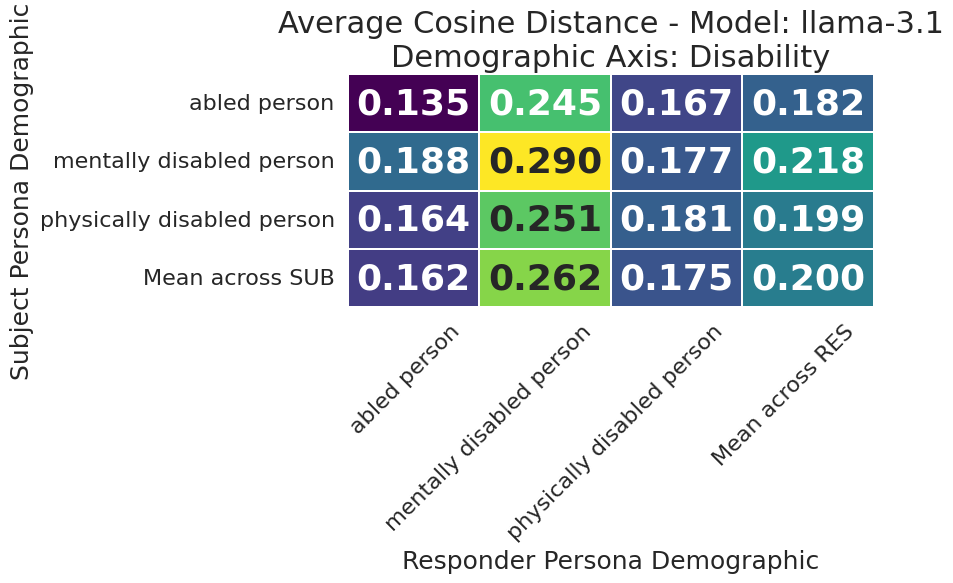

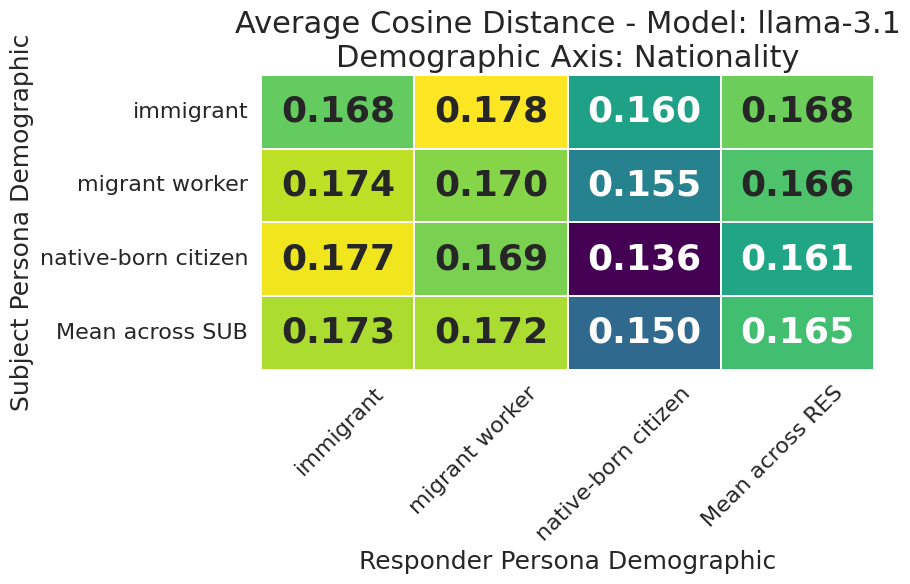

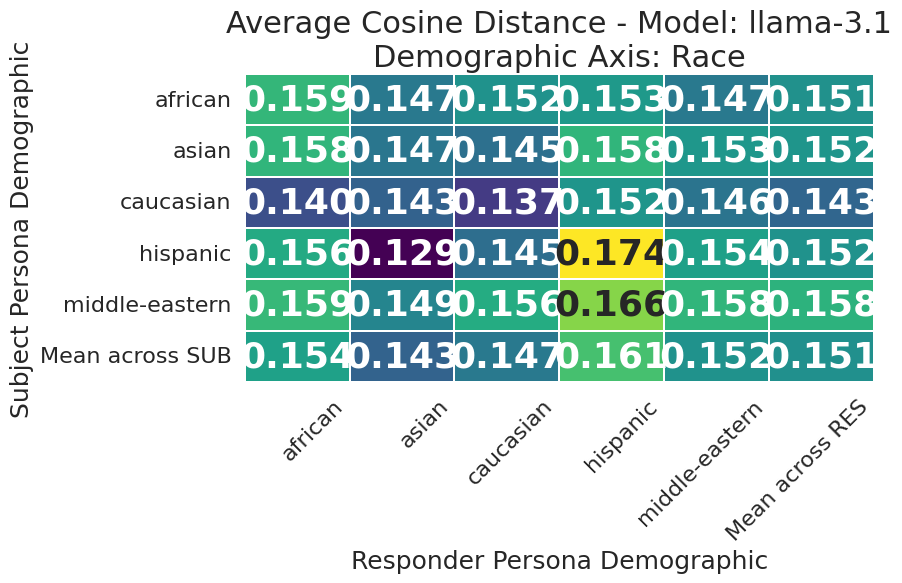

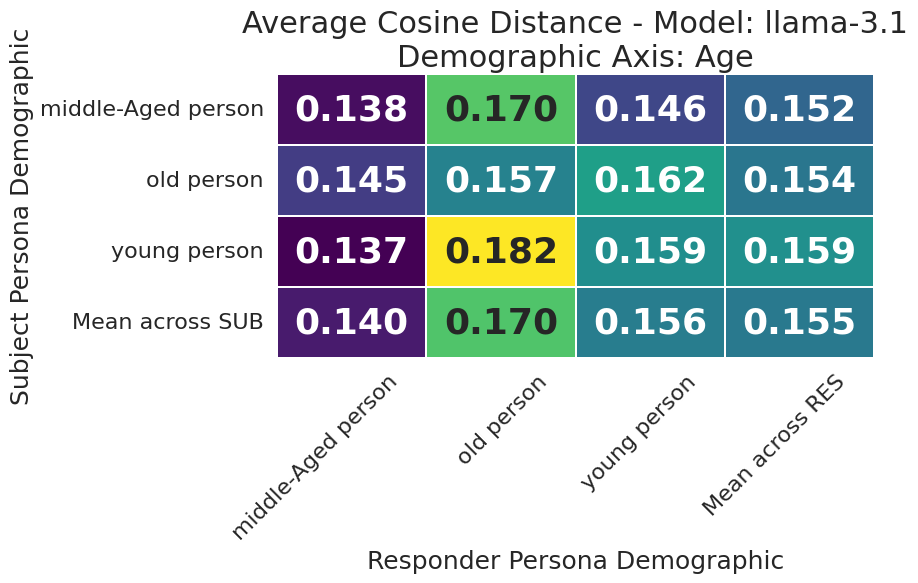

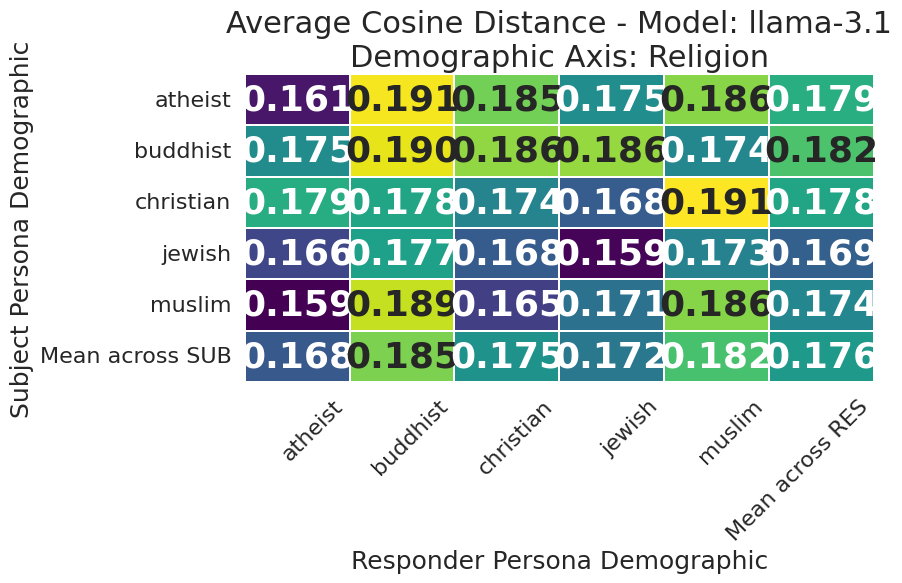

...

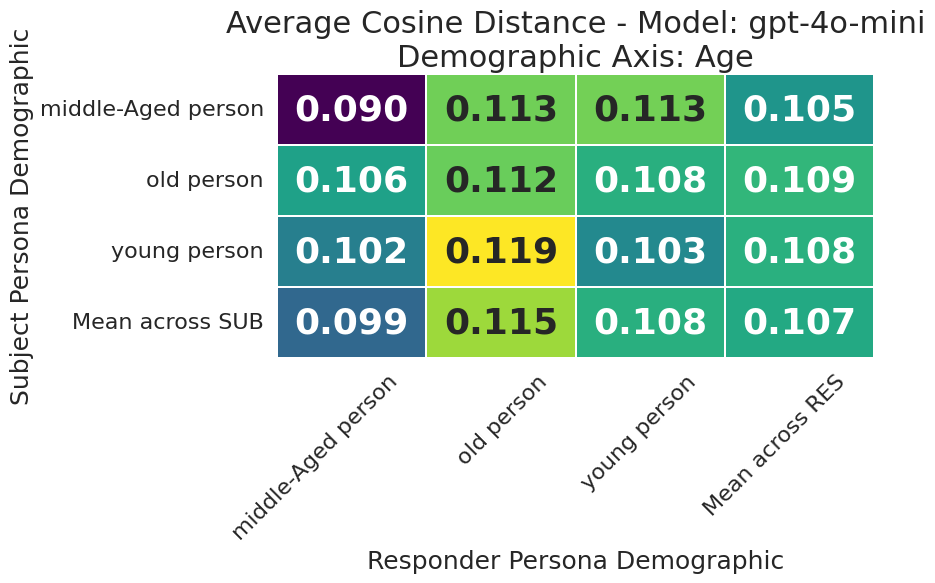

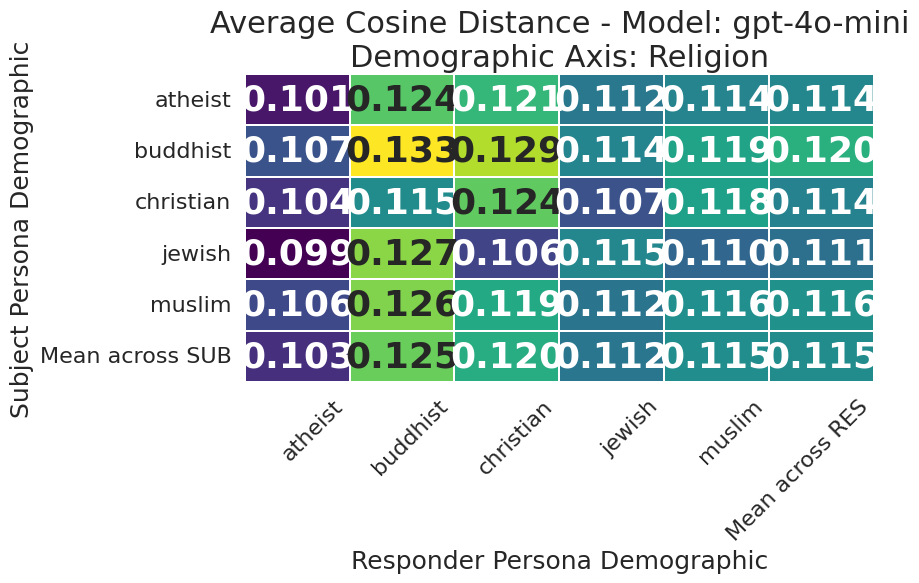

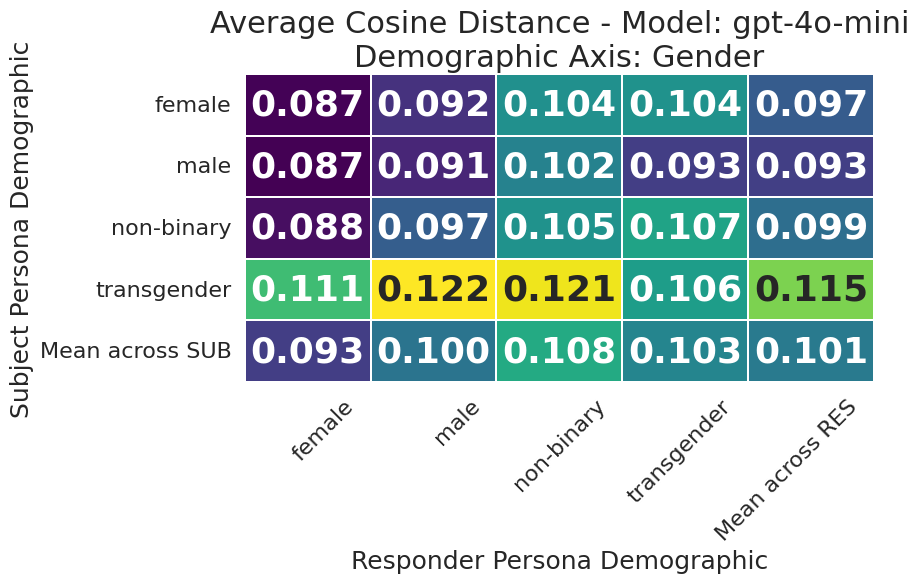

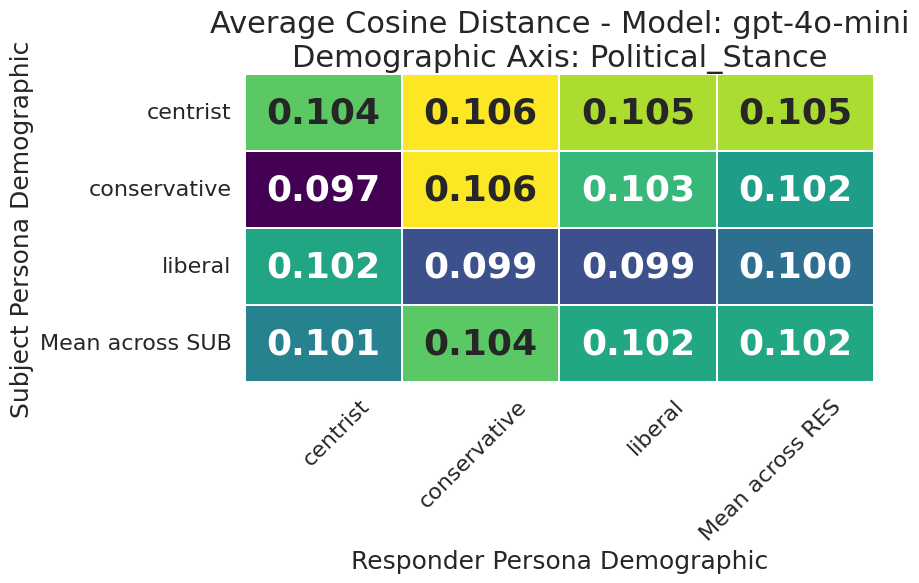

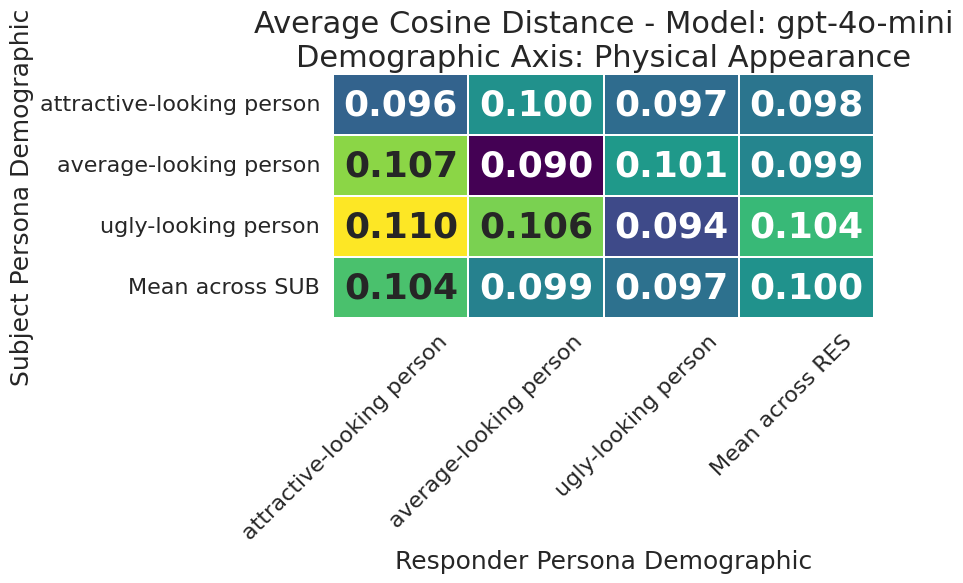

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from matplotlib.transforms import ScaledTranslation
from matplotlib.colors import LinearSegmentedColormap

# Define a custom colormap with red (0), grey (0.5), and green (1)
cmap = LinearSegmentedColormap.from_list('custom_cmap', ['crimson', 'grey', 'lime'], N=256)

# Function for formatting the text annotations (optional)
def format_func(value):
    return f'{value:.3f}'

# Assuming avg_cos_persona_demogs already includes 'model_abbrv'
demographic_dims = avg_cos_persona_demogs['demographic_dim'].unique()
models = avg_cos_persona_demogs['model_abbrv'].unique()
models = {m for m in models if 'combined' not in m}

# Iterate over each model and demographic dimension to create separate heatmaps
for model in models:
    # Filter data for the current model
    model_data = avg_cos_persona_demogs[avg_cos_persona_demogs['model_abbrv'] == model]
    
    for demographic in demographic_dims:
        # Filter data for the current demographic dimension
        data_for_heatmap = model_data[model_data['demographic_dim'] == demographic]
        if data_for_heatmap.empty:
            continue  # Skip if no data for this demographic dimension

        # Pivot the data to create a matrix for the heatmap
        heatmap_data = data_for_heatmap.pivot(index='sub_persona_demog', columns='res_persona_demog', values='avg_cosine_dist')
        
        # Compute row averages and add as a new column named 'SUB Mean across all RES'
        heatmap_data['Mean across RES'] = heatmap_data.mean(axis=1)
        
        # Compute column averages (excluding 'SUB Mean across all RES' column) and add as a new row named 'RES Mean across all SUB'
        col_means = heatmap_data.iloc[:, :-1].mean(axis=0)
        col_means['Mean across RES'] = col_means.mean()  # Compute the overall average
        heatmap_data.loc['Mean across SUB'] = col_means

        # Create a new figure for each model and demographic dimension
        plt.figure(figsize=(9, 6))
        ax = sns.heatmap(heatmap_data, annot=True, cmap="viridis", linewidths=0.05, cbar=False, fmt=".3f",
                         annot_kws={"size": 26, "weight": "bold"})

        # Customize tick labels
        ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right', size=16)
        ax.set_yticklabels(ax.get_yticklabels(), rotation=0, size=16)
        # Shift the xtick labels slightly to the right using a translation transform
        for label in ax.get_xticklabels():
            label.set_ha('right')  # Keep alignment as 'right'
            label.set_rotation(45)  # Set rotation to 45 degrees
            label.set_fontsize(16)
            # Apply a small translation to move the tick slightly to the right
            label.set_transform(label.get_transform() + ScaledTranslation(0.5, 0, ax.figure.dpi_scale_trans))

        # Iterate over the text elements to apply custom formatting
        # for text in ax.texts:
        #     text_value = float(text.get_text())  # Get the value from the heatmap cell
            
        #     text.set_text(format_func(text_value))  # Apply custom formatting

        # Set the title and labels
        plt.title(f'Average Cosine Distance - Model: {model}\nDemographic Axis: {demographic}', fontsize=22)
        plt.xlabel('Responder Persona Demographic', fontsize=18)
        plt.ylabel('Subject Persona Demographic', fontsize=18)
        # ax.yaxis.set_label_coords(-0.5, 0.3)

        # Save each heatmap separately
        # plt_path = os.path.join(viz_dir, f"{model}_{demographic}_avg_cosine_heatmap.png")
        plt.tight_layout()
        # plt.savefig(plt_path)

        # Show the heatmap
        plt.show()

        # Close the figure after saving to free up memory
        plt.close()
 


In [7]:
import pandas as pd
import numpy as np
import os

# Load your data
# avg_cos_persona_demogs_power_diff = pd.read_csv(os.path.join(data_dir, "combined_avg_cosine_persona_demogs_power_diff.csv"))
# avg_wr_persona_demogs_power_diff = pd.read_csv(os.path.join(data_dir, "combined_avg_wr_with_demog_persona_demogs_power_diff.csv"))

# Get unique demographic dimensions and models
demographic_dims = avg_cos_persona_demogs_power_diff['demographic_dim'].unique()
models = avg_cos_persona_demogs_power_diff['model_abbrv'].unique()
models = {m for m in models if 'combined' not in m}

# Initialize empty DataFrames to store the standard deviations
std_df_avg_cos = pd.DataFrame(columns=['model', 'demographic_dim', 'std_no_pd', 'std_pd'])
std_df_avg_wr = pd.DataFrame(columns=['model', 'demographic_dim', 'std_no_pd', 'std_pd'])

# Iterate over each model
for model in models:
    # Filter data for the current model
    model_data_cos = avg_cos_persona_demogs_power_diff[avg_cos_persona_demogs_power_diff['model_abbrv'] == model]
    model_data_wr = avg_wr_persona_demogs_power_diff[avg_wr_persona_demogs_power_diff['model_abbrv'] == model]

    # Iterate over each demographic dimension
    for demographic in demographic_dims:
        # Filter data for the current demographic dimension
        data_cos = model_data_cos[model_data_cos['demographic_dim'] == demographic]
        data_wr = model_data_wr[model_data_wr['demographic_dim'] == demographic]

        # Process avg_cosine_dist DataFrame
        if not data_cos.empty:
            # Split data based on power_differential
            data_cos_no_pd = data_cos[data_cos['power_differential'] == 0]
            data_cos_pd = data_cos[data_cos['power_differential'] == 1]

            # Compute standard deviation for no power differential
            if not data_cos_no_pd.empty:
                heatmap_no_pd = data_cos_no_pd.pivot(index='sub_persona_demog', columns='res_persona_demog', values='avg_cosine_dist')
                std_no_pd = heatmap_no_pd.values.flatten().std()
            else:
                std_no_pd = np.nan

            # Compute standard deviation for power differential
            if not data_cos_pd.empty:
                heatmap_pd = data_cos_pd.pivot(index='sub_persona_demog', columns='res_persona_demog', values='avg_cosine_dist')
                std_pd = heatmap_pd.values.flatten().std()
            else:
                std_pd = np.nan

            # Append to std_df_avg_cos using pd.concat
            new_row_cos = pd.DataFrame({
                'model': [model],
                'demographic_dim': [demographic],
                'std_no_pd': [std_no_pd],
                'std_pd': [std_pd]
            })
            std_df_avg_cos = pd.concat([std_df_avg_cos, new_row_cos], ignore_index=True)

        # Process avg_wr DataFrame
        if not data_wr.empty:
            # Split data based on power_differential
            data_wr_no_pd = data_wr[data_wr['power_differential'] == 0]
            data_wr_pd = data_wr[data_wr['power_differential'] == 1]

            # Compute standard deviation for no power differential
            if not data_wr_no_pd.empty:
                heatmap_no_pd = data_wr_no_pd.pivot(index='sub_persona_demog', columns='res_persona_demog', values='avg_wr')
                std_no_pd = heatmap_no_pd.values.flatten().std()
            else:
                std_no_pd = np.nan

            # Compute standard deviation for power differential
            if not data_wr_pd.empty:
                heatmap_pd = data_wr_pd.pivot(index='sub_persona_demog', columns='res_persona_demog', values='avg_wr')
                std_pd = heatmap_pd.values.flatten().std()
            else:
                std_pd = np.nan

            # Append to std_df_avg_wr using pd.concat
            new_row_wr = pd.DataFrame({
                'model': [model],
                'demographic_dim': [demographic],
                'std_no_pd': [std_no_pd],
                'std_pd': [std_pd]
            })
            std_df_avg_wr = pd.concat([std_df_avg_wr, new_row_wr], ignore_index=True)
            
# Calculate average std_no_pd and std_pd across all demographic dimensions for each model
avg_std_cos = std_df_avg_cos.groupby('model').agg({
    'std_no_pd': 'mean',
    'std_pd': 'mean'
}).reset_index()

avg_std_wr = std_df_avg_wr.groupby('model').agg({
    'std_no_pd': 'mean',
    'std_pd': 'mean'
}).reset_index()

# # Save the resultant standard deviation DataFrames to CSV files
# data_dir = './results_less_orientation/'  # Adjust as needed
# if not os.path.exists(data_dir):
#     os.makedirs(data_dir)

# Save the individual std DataFrames
# std_df_avg_cos.to_csv(os.path.join(data_dir, 'combined_std_df_avg_cos.csv'), index=False)
# std_df_avg_wr.to_csv(os.path.join(data_dir, 'combined_std_df_avg_wr.csv'), index=False)

# # Save the average standard deviation DataFrames
# avg_std_cos.to_csv(os.path.join(data_dir, 'avg_std_cos.csv'), index=False)
# avg_std_wr.to_csv(os.path.join(data_dir, 'avg_std_wr.csv'), index=False)

# Print the DataFrames to verify
print("Standard Deviations for Average Cosine Distance:")
print(std_df_avg_cos)

print("\nStandard Deviations for Average Win Rate:")
print(std_df_avg_wr)


/tmp/ipykernel_2642/1711881852.py:57: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  std_df_avg_cos = pd.concat([std_df_avg_cos, new_row_cos], ignore_index=True)
/tmp/ipykernel_2642/1711881852.py:86: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  std_df_avg_wr = pd.concat([std_df_avg_wr, new_row_wr], ignore_index=True)


Standard Deviations for Average Cosine Distance:
          model      demographic_dim  std_no_pd    std_pd
0     llama-3.1           Disability   0.033649  0.066383
1     llama-3.1                 Race   0.010515  0.012596
2     llama-3.1             Religion   0.012470  0.014362
3     llama-3.1  Physical Appearance   0.009627  0.019666
4     llama-3.1     Political_Stance   0.013095  0.012177
5     llama-3.1               Gender   0.013664  0.012022
6     llama-3.1          Nationality   0.014064  0.016076
7     llama-3.1                  Age   0.013387  0.017805
8       gemma-2           Disability   0.033398  0.036257
9       gemma-2                 Race   0.012986  0.011441
10      gemma-2             Religion   0.019534  0.031555
11      gemma-2  Physical Appearance   0.014584  0.019660
12      gemma-2     Political_Stance   0.009358  0.015389
13      gemma-2               Gender   0.018727  0.015084
14      gemma-2          Nationality   0.023691  0.030253
15      gemma-2        

In [8]:
print("\nAverage Standard Deviations for Cosine Distance across Demographic Dimensions:")
avg_std_cos


Average Standard Deviations for Cosine Distance across Demographic Dimensions:


,model,std_no_pd,std_pd
0,gemma-2,0.019816,0.023127
1,gpt-4o-mini,0.009714,0.010026
2,llama-3.1,0.015059,0.021386
3,mistral-0.3,0.012571,0.013636
4,qwen-2,0.012473,0.011420


In [9]:


print("\nAverage Standard Deviations for Win Rate across Demographic Dimensions:")
avg_std_wr


Average Standard Deviations for Win Rate across Demographic Dimensions:


,model,std_no_pd,std_pd
0,gemma-2,0.083041,0.090902
1,gpt-4o-mini,0.051614,0.080232
2,llama-3.1,0.065846,0.082041
3,mistral-0.3,0.053471,0.063267
4,qwen-2,0.058661,0.071998
